# Strawberries - complete with examples

Final solution to the problem of detecting strawberries in images, shown applied to 10 images.

Made to accompany a talk to the Perth Python meetup group on 4/8/2016 by Alex Louden

In [1]:
%matplotlib inline
import cv2
from matplotlib import pyplot as plt
import numpy as np
from math import cos, sin
from __future__ import division
green = (0, 255, 0)

In [2]:
def show(image):
    # Figure size in inches
    plt.figure(figsize=(10, 10))

    # Show image, with nearest neighbour interpolation
    plt.imshow(image, interpolation='nearest')

def show_mask(mask):
    plt.figure(figsize=(5, 5))
    plt.imshow(mask, cmap='gray')

def overlay_mask(mask, image):
    rgb_mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
    img = cv2.addWeighted(rgb_mask, 0.5, image, 0.5, 0)
    return img

In [3]:
def find_biggest_contour(image):

    # Copy
    image = image.copy()
    contours, hierarchy = cv2.findContours(image, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Isolate largest contour
    contour_sizes = [(cv2.contourArea(contour), contour) for contour in contours]
    biggest_contour = max(contour_sizes, key=lambda x: x[0])[1]

    mask = np.zeros(image.shape, np.uint8)
    cv2.drawContours(mask, [biggest_contour], -1, 255, -1)
    return biggest_contour, mask

In [8]:
def draw_ellipse_axis(ellipse, image):
    # Unused - doesn't really add much to the final example
    center, size, angle = ellipse
    r = max(size)/2
    angle = np.deg2rad(angle + 90)
    x0 = int(center[0] - r * cos(angle))
    y0 = int(center[1] - r * sin(angle))
    x1 = int(center[0] + r * cos(angle))
    y1 = int(center[1] + r * sin(angle))
    cv2.line(image, (x0, y0), (x1, y1), green, 2, cv2.CV_AA)

def circle_contour(image, contour):
    # Bounding ellipse
    image_with_ellipse = image.copy()
    ellipse = cv2.fitEllipse(contour)
    cv2.ellipse(image_with_ellipse, ellipse, green, 2, cv2.CV_AA)
#     draw_ellipse_axis(ellipse, image_with_ellipse)
    return image_with_ellipse

In [13]:
def find_strawberry(image):
    # Convert from BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Make a consistent size
    max_dimension = max(image.shape)
    scale = 700/max_dimension
    image = cv2.resize(image, None, fx=scale, fy=scale)

    show(image)
    
    # Blur
    image_blur = cv2.GaussianBlur(image, (7, 7), 0)
    image_blur_hsv = cv2.cvtColor(image_blur, cv2.COLOR_RGB2HSV)

    # Filter by colour
    # 0-10 hue
    min_red = np.array([0, 100, 80])
    max_red = np.array([10, 256, 256])
    mask1 = cv2.inRange(image_blur_hsv, min_red, max_red)

    # 170-180 hue
    min_red2 = np.array([170, 100, 80])
    max_red2 = np.array([180, 256, 256])
    mask2 = cv2.inRange(image_blur_hsv, min_red2, max_red2)

    # Combine masks
    mask = mask1 + mask2

    # Clean up
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    mask_closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask_clean = cv2.morphologyEx(mask_closed, cv2.MORPH_OPEN, kernel)

    # Find biggest strawberry
    big_strawberry_contour, mask_strawberries = find_biggest_contour(mask_clean)

    # Overlay cleaned mask on image
    overlay = overlay_mask(mask_clean, image)

    # Circle biggest strawberry
    circled = circle_contour(overlay, big_strawberry_contour)
    show(circled)
    
    bgr = cv2.cvtColor(circled, cv2.COLOR_RGB2BGR)
    
    return bgr

True

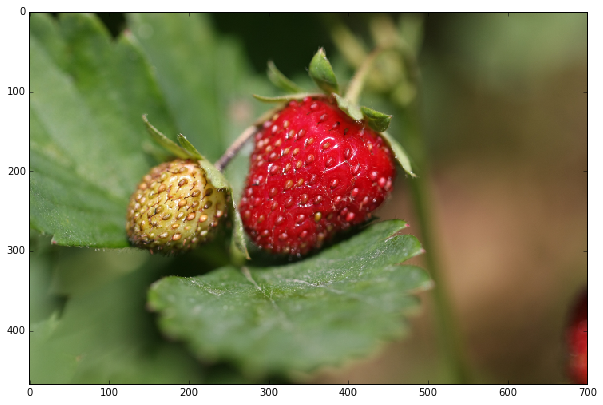

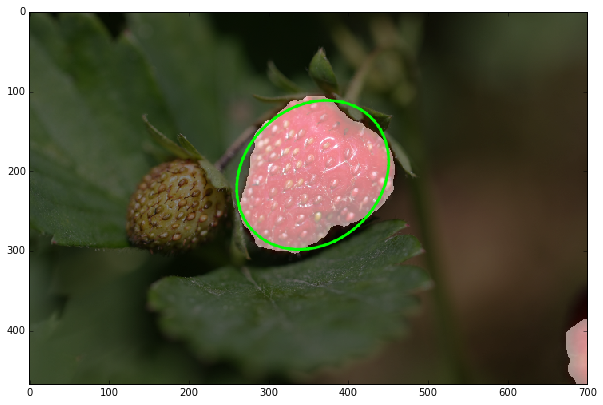

In [14]:
image = cv2.imread('strawberries.jpg')
result = find_strawberry(image)
cv2.imwrite('strawberries_found.jpg', result)

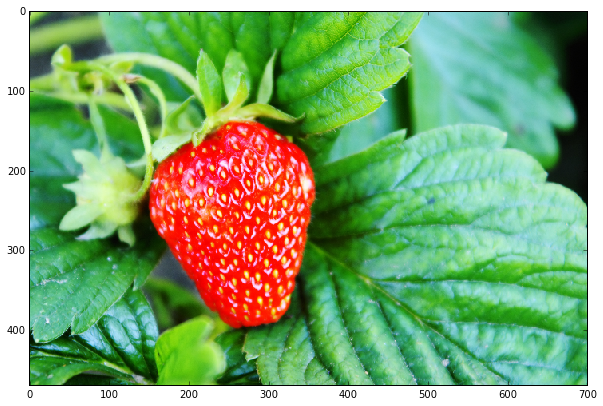

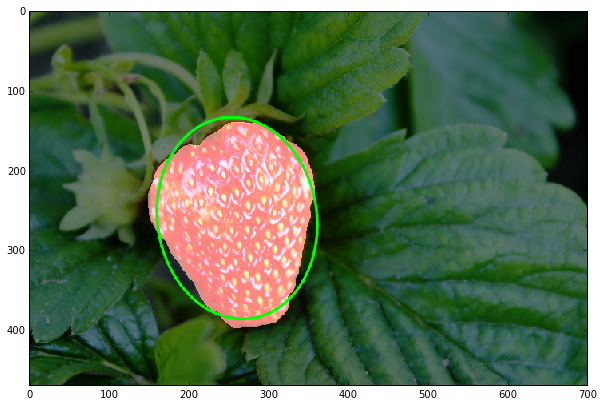

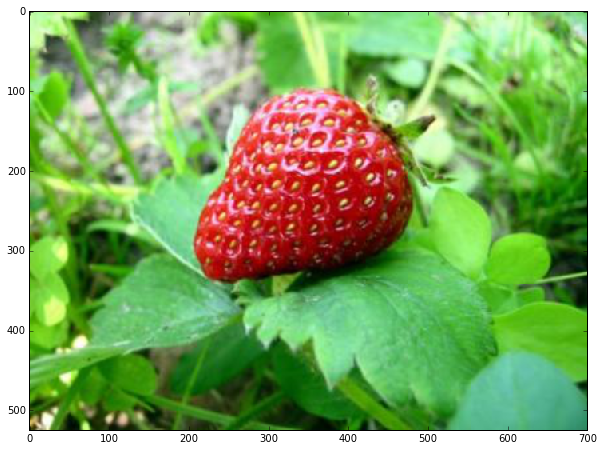

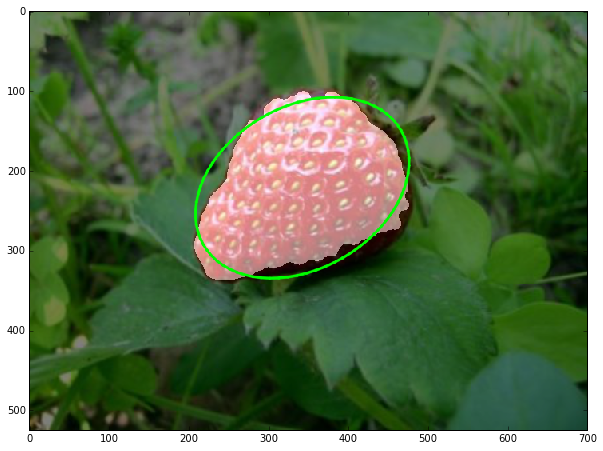

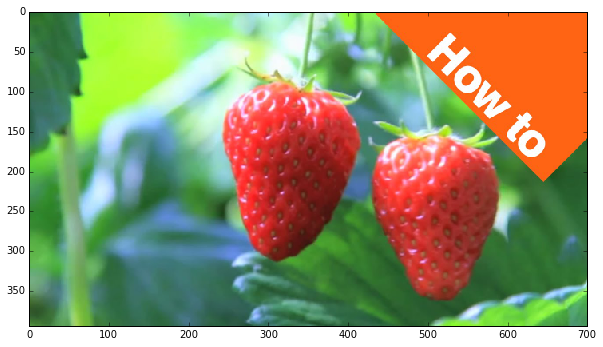

...

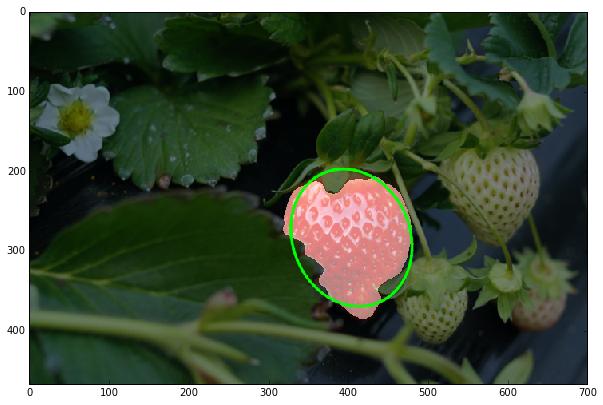

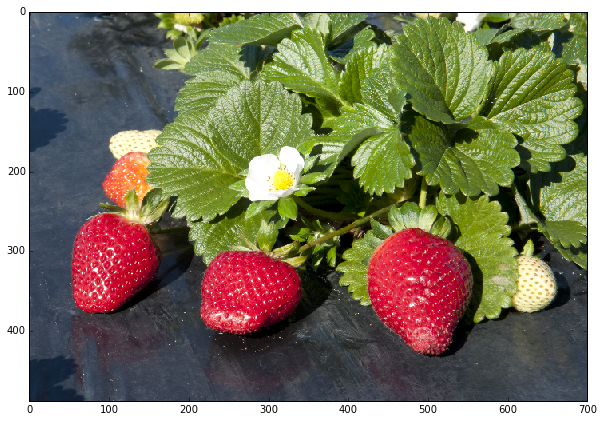

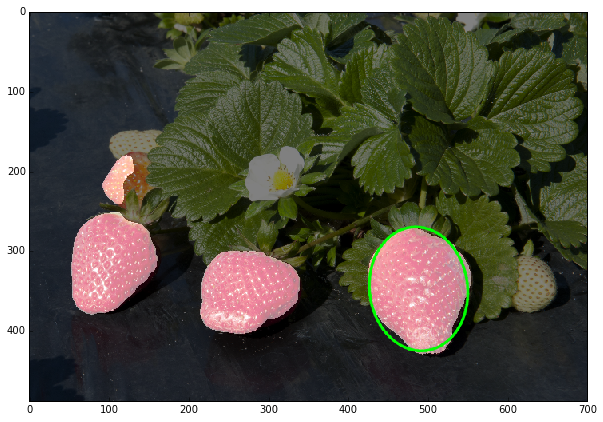

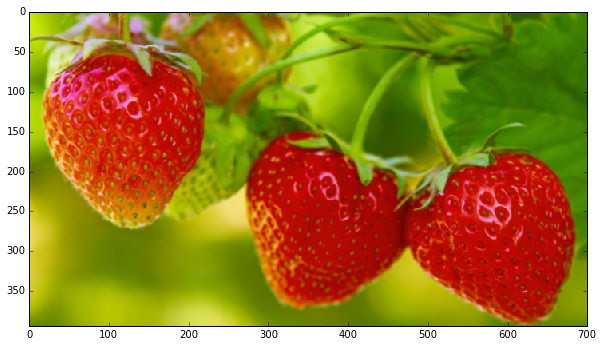

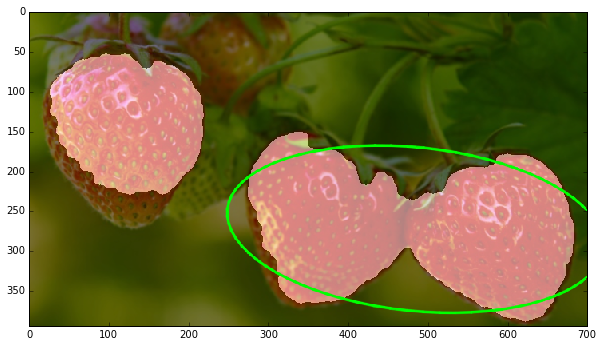

In [7]:
for i in range(1, 10):
    filename = 'examples/{}.jpg'.format(i)
    image = cv2.imread(filename)
    find_strawberry(image)